# Proyecto final - Telecomunicaciones


## Contexto

### Descripción del problema

El servicio de telefonía virtual CallMeMaybe está desarrollando una nueva función que brindará a los supervisores y las supervisores información sobre los operadores menos eficaces.

Se considera que un operador es ineficaz si tiene una gran cantidad de llamadas entrantes perdidas (internas y externas) y un tiempo de espera prolongado para las llamadas entrantes. Además, si se supone que un operador debe realizar llamadas salientes, un número reducido de ellas también será un signo de ineficacia.

- Lleva a cabo el análisis exploratorio de datos
- Identificar operadores ineficaces
- Prueba las hipótesis estadísticas



### Descripción de los datos

Los datasets contienen información sobre el uso del servicio de telefonía virtual CallMeMaybe. Sus clientes son organizaciones que necesitan distribuir gran cantidad de llamadas entrantes entre varios operadores, o realizar llamadas salientes a través de sus operadores. Los operadores también pueden realizar llamadas internas para comunicarse entre ellos. Estas llamadas se realizan a través de la red de CallMeMaybe.

El dataset comprimido `telecom_dataset_us.csv` contiene las siguientes columnas:

- `user_id`: ID de la cuenta de cliente

- `date`: fecha en la que se recuperaron las estadísticas

- `direction`: "dirección" de llamada (`out` para saliente, `in` para entrante)

- `internal`: si la llamada fue interna (entre los operadores de un cliente o clienta)

- `operator_id`: identificador del operador

- `is_missed_call`: si fue una llamada perdida

- `calls_count`: número de llamadas

- `call_duration`: duración de la llamada (sin incluir el tiempo de espera)

- `total_call_duration`: duración de la llamada (incluido el tiempo de espera)

 
El conjunto de datos `telecom_clients_us.csv` tiene las siguientes columnas:

- `user_id`: ID de usuario/a

- `tariff_plan`: tarifa actual de la clientela

- `date_start`: fecha de registro de la clientela

## Cargar datos y librerías

### Importar librerías

In [1]:
import pandas as pd
from datetime import datetime as dt
import numpy as np
import math
from scipy import stats as st
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
from plotly import graph_objects as go
import plotly.figure_factory as ff
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler 
from scipy.cluster.hierarchy import dendrogram, linkage 
from sklearn.cluster import KMeans 
from sklearn.metrics import silhouette_score

### Cargar datos

In [2]:
calls = pd.read_csv('/home/necho/Documentos/cursos/triple_ten/data_analyst_bootcamp/proyecto_final/telecom_dataset_us.csv')
users = pd.read_csv('/home/necho/Documentos/cursos/triple_ten/data_analyst_bootcamp/proyecto_final/telecom_clients_us.csv')

## Exploración inicial de los datasets

### Dataset `'telecom_dataset_us.csv'`

#### Una muestra del dataset

In [3]:
# Se imprime una muestras de los registros del dataset
print("-- Una muestra de los datos: \n")
display(calls.head())

-- Una muestra de los datos: 



,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration
0,166377,2019-08-04 00:00:00+03:00,in,False,NaN,True,2,0,4
1,166377,2019-08-05 00:00:00+03:00,out,True,880022.0,True,3,0,5
2,166377,2019-08-05 00:00:00+03:00,out,True,880020.0,True,1,0,1
3,166377,2019-08-05 00:00:00+03:00,out,True,880020.0,False,1,10,18
4,166377,2019-08-05 00:00:00+03:00,out,False,880022.0,True,3,0,25


#### Información general del dataset

In [4]:
# Se lee la infomación general del dataset
print("-- Información general del dataset: \n")
calls.info()

-- Información general del dataset: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53902 entries, 0 to 53901
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   user_id              53902 non-null  int64  
 1   date                 53902 non-null  object 
 2   direction            53902 non-null  object 
 3   internal             53785 non-null  object 
 4   operator_id          45730 non-null  float64
 5   is_missed_call       53902 non-null  bool   
 6   calls_count          53902 non-null  int64  
 7   call_duration        53902 non-null  int64  
 8   total_call_duration  53902 non-null  int64  
dtypes: bool(1), float64(1), int64(4), object(3)
memory usage: 3.3+ MB


#### Tipos de datos en el dataset

In [5]:
# Se validan los tipos de datos de las columnas
print("-- Tipos de datos del dataset: \n")
display(calls.dtypes)

-- Tipos de datos del dataset: 



user_id                  int64
date                    object
direction               object
internal                object
operator_id            float64
is_missed_call            bool
calls_count              int64
call_duration            int64
total_call_duration      int64
dtype: object

#### Información numérica del dataset

In [6]:
print("-- Se muestra información numérica del dataset:\n")
display(calls.describe())

-- Se muestra información numérica del dataset:



,user_id,operator_id,calls_count,call_duration,total_call_duration
count,53902.000000,45730.000000,53902.000000,53902.000000,53902.000000
mean,167295.344477,916535.993002,16.451245,866.684427,1157.133297
std,598.883775,21254.123136,62.917170,3731.791202,4403.468763
min,166377.000000,879896.000000,1.000000,0.000000,0.000000
25%,166782.000000,900788.000000,1.000000,0.000000,47.000000
50%,167162.000000,913938.000000,4.000000,38.000000,210.000000
75%,167819.000000,937708.000000,12.000000,572.000000,902.000000
max,168606.000000,973286.000000,4817.000000,144395.000000,166155.000000


### Dataset `'telecom_clients_us.csv'`

#### Una muestra del dataset

In [7]:
# Se imprime una muestras de los registros del dataset
print("-- Una muestra de los datos: \n")
display(users.head())

-- Una muestra de los datos: 



,user_id,tariff_plan,date_start
0,166713,A,2019-08-15
1,166901,A,2019-08-23
2,168527,A,2019-10-29
3,167097,A,2019-09-01
4,168193,A,2019-10-16


#### Información general del dataset

In [8]:
# Se lee la infomación general del dataset
print("-- Información general del dataset: \n")
users.info()

-- Información general del dataset: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 732 entries, 0 to 731
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   user_id      732 non-null    int64 
 1   tariff_plan  732 non-null    object
 2   date_start   732 non-null    object
dtypes: int64(1), object(2)
memory usage: 17.3+ KB


#### Tipos de datos en el dataset

In [9]:
# Se validan los tipos de datos de las columnas
print("-- Tipos de datos del dataset: \n")
display(users.dtypes)

-- Tipos de datos del dataset: 



user_id         int64
tariff_plan    object
date_start     object
dtype: object

#### Información numérica del dataset

In [10]:
print("-- Se muestra información numérica del dataset:\n")
display(users.describe())

-- Se muestra información numérica del dataset:



,user_id
count,732.000000
mean,167431.927596
std,633.810383
min,166373.000000
25%,166900.750000
50%,167432.000000
75%,167973.000000
max,168606.000000


### Hallazgos

#### Dataset `'calls'`

- Se encontró datos ausentes en la columna `'operator_id'`. Son $8172$ datos ausentes para dicha columna. Dado la cantidad de datos ausentes, y que la columna identifica a los operadores, se decide no eliminar dichos registros. 

- La columna `'internal'` tiene $117$ datos ausentes. Como no es posible completar dicha información de forma confiable, y que la información adicional de dichos registros es valiosa, se decide no intervenir dichos datos.

- Se cambiará el tipo de datos para la siguientes columnas:

    - `'direction'`: Se cambia de `object` a `category` 
    - `'internal'`: Se cambia de `object` a `bool`
    - `'operator_id'`: Se cambia de `float` a `int`
    - `'date'`: Se cambia de `object` a `Datetime`

- Los nombres de las columnas están normalizados, no es necesario procesarlos.

#### Dataset `'users'`

- No se encontraron datos ausentes

- Se cambiará el tipo de datos para la columna:

    - `'date'`: Se cambia de `object` a `Datetime`

- Los nombres de las columnas se encuentran normalizados.

## Preprocesamientos de datos

- Validar la integridad de los datos: esto es si los datos son coherentes con las variables que representan, o si existen incoherencias entre los datos.

- Agrupar datos:

    - Fusionar los datos de las tarifas de los usuarios con los datos de las llamadas.

    - Y la antiguedad de los usuarios

### Valores duplicados

- Se analizan los datasets en busca de valores  duplicados

In [11]:
# Se valida la existencia de registros duplicados en el dataset
calls_logs_duplicated = calls.duplicated().sum()
print(f"-- Número de registros duplicados en 'calls': {calls_logs_duplicated}")

users_logs_duplicated = users.duplicated().sum()
print(f"-- Número de registros duplicados en 'users': {users_logs_duplicated}")

-- Número de registros duplicados en 'calls': 4900
-- Número de registros duplicados en 'users': 0


Se procede al borrado de los registros duplicados en el dataset `calls`:

In [12]:
# Se eliminan los registros duplicados
calls.drop_duplicates(inplace=True)

# Se valida la operación
calls.info()


<class 'pandas.core.frame.DataFrame'>
Index: 49002 entries, 0 to 53901
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   user_id              49002 non-null  int64  
 1   date                 49002 non-null  object 
 2   direction            49002 non-null  object 
 3   internal             48892 non-null  object 
 4   operator_id          41546 non-null  float64
 5   is_missed_call       49002 non-null  bool   
 6   calls_count          49002 non-null  int64  
 7   call_duration        49002 non-null  int64  
 8   total_call_duration  49002 non-null  int64  
dtypes: bool(1), float64(1), int64(4), object(3)
memory usage: 3.4+ MB


### Valores ausentes

- En el análisis exploratorio se encontró valores ausentes en las columnas `operator_id` e `interenal` del dataset `calls`.

- Se decide completar los valores ausentes con `0` para conservar la información de los registros y no alterar la información de los operadores.

- Para los datos de la columna internal se decide borrar dichos registros, $110$ en total. Lo cual no representa un pérdida significativa de información.

- Se procede a completar los datos en la columna `operator_id`:

In [13]:
# Se completan los valores ausentes en la coluimna operator_id
calls['operator_id'].fillna(0, inplace=True)

# Se valida el dataset
print(f"-- Una muestra del dataset:\n")
display(calls[calls['operator_id'] == 0].head())

print(f"-- Información general del dataset:\n")
calls.info()

-- Una muestra del dataset:



,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration
0,166377,2019-08-04 00:00:00+03:00,in,False,0.0,True,2,0,4
7,166377,2019-08-05 00:00:00+03:00,in,False,0.0,True,6,0,35
9,166377,2019-08-06 00:00:00+03:00,in,False,0.0,True,4,0,62
17,166377,2019-08-07 00:00:00+03:00,in,False,0.0,True,2,0,24
27,166377,2019-08-12 00:00:00+03:00,in,False,0.0,True,2,0,34


-- Información general del dataset:

<class 'pandas.core.frame.DataFrame'>
Index: 49002 entries, 0 to 53901
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   user_id              49002 non-null  int64  
 1   date                 49002 non-null  object 
 2   direction            49002 non-null  object 
 3   internal             48892 non-null  object 
 4   operator_id          49002 non-null  float64
 5   is_missed_call       49002 non-null  bool   
 6   calls_count          49002 non-null  int64  
 7   call_duration        49002 non-null  int64  
 8   total_call_duration  49002 non-null  int64  
dtypes: bool(1), float64(1), int64(4), object(3)
memory usage: 3.4+ MB


- Se procede a eliminar los registros ausentes en la columna `internal`

In [14]:
# Se eliminan los registros ausentes en la columna 'internal'
calls.dropna(inplace=True)
calls.reset_index(drop=True, inplace=True)

# Se valida la operación
calls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48892 entries, 0 to 48891
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   user_id              48892 non-null  int64  
 1   date                 48892 non-null  object 
 2   direction            48892 non-null  object 
 3   internal             48892 non-null  object 
 4   operator_id          48892 non-null  float64
 5   is_missed_call       48892 non-null  bool   
 6   calls_count          48892 non-null  int64  
 7   call_duration        48892 non-null  int64  
 8   total_call_duration  48892 non-null  int64  
dtypes: bool(1), float64(1), int64(4), object(3)
memory usage: 3.0+ MB


### Cambiar tipos de datos

- Se procede a cambiar el tipo de datos de las columnas en el dataset `calls`:

    - `'direction'`: Se cambia de `object` a `category` 
    - `'internal'`: Se cambia de `object` a `bool`
    - `'operator_id'`: Se cambia de `float` a `int`
    - `'date'`: Se cambia de `object` a `Datetime`

- Y de la columna en el dataset `users`:

    - `'date'`: Se cambia de `object` a `Datetime`

In [15]:
# Se cambian los tipos de datos
calls['direction'] = calls['direction'].astype('category')
calls['internal'] = calls['internal'].astype('bool')
calls['operator_id'] = calls['operator_id'].astype('int')
calls['date'] = pd.to_datetime(calls['date'])

users['date_start'] = pd.to_datetime(users['date_start'])

# se valida la operación realizada
calls.info()
print()
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48892 entries, 0 to 48891
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype                    
---  ------               --------------  -----                    
 0   user_id              48892 non-null  int64                    
 1   date                 48892 non-null  datetime64[ns, UTC+03:00]
 2   direction            48892 non-null  category                 
 3   internal             48892 non-null  bool                     
 4   operator_id          48892 non-null  int64                    
 5   is_missed_call       48892 non-null  bool                     
 6   calls_count          48892 non-null  int64                    
 7   call_duration        48892 non-null  int64                    
 8   total_call_duration  48892 non-null  int64                    
dtypes: bool(2), category(1), datetime64[ns, UTC+03:00](1), int64(5)
memory usage: 2.4 MB

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 732

### Crear nuevas características

En el dataset `calls` se crean nuevas características así:

- Se crean columnas para días, días de la semana y mes de las llamadas a partir de la columna `'date'`.

- Se crea columna para la duración de las llamadas en minutos a partir de la columna `'call_duration'`.

- Se crea columna para la duración total de las llamadas en minutos a partir de la columna `'total_call_duration'`.

- Día, día de la semana y mes de la llamada:

In [16]:
calls['day']    = calls['date'].dt.day
calls['month']  = calls['date'].dt.month
calls['day_of_week']  = calls['date'].dt.dayofweek

# Se valida la operación
calls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48892 entries, 0 to 48891
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype                    
---  ------               --------------  -----                    
 0   user_id              48892 non-null  int64                    
 1   date                 48892 non-null  datetime64[ns, UTC+03:00]
 2   direction            48892 non-null  category                 
 3   internal             48892 non-null  bool                     
 4   operator_id          48892 non-null  int64                    
 5   is_missed_call       48892 non-null  bool                     
 6   calls_count          48892 non-null  int64                    
 7   call_duration        48892 non-null  int64                    
 8   total_call_duration  48892 non-null  int64                    
 9   day                  48892 non-null  int32                    
 10  month                48892 non-null  int32                    
 11  da

* Duración de las llamadas en minutos:

In [17]:
# Se crean las columnas para la duración de las llamadas en minutos
calls['call_duration_minutes'] = calls['call_duration'] / 60
calls['total_call_duration_minutes'] = calls['total_call_duration'] / 60

# Se valida la operación
calls.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48892 entries, 0 to 48891
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype                    
---  ------                       --------------  -----                    
 0   user_id                      48892 non-null  int64                    
 1   date                         48892 non-null  datetime64[ns, UTC+03:00]
 2   direction                    48892 non-null  category                 
 3   internal                     48892 non-null  bool                     
 4   operator_id                  48892 non-null  int64                    
 5   is_missed_call               48892 non-null  bool                     
 6   calls_count                  48892 non-null  int64                    
 7   call_duration                48892 non-null  int64                    
 8   total_call_duration          48892 non-null  int64                    
 9   day                          48892 non-null  int32

#### Pasar la columna `'day_of_week'` a tipo catégorico

- Se cambia el tipo de datos de la columna `day_of_week` a tipo categórico, donde cada categoría corresponde a un día de la semana.

- Al obtener el día de la semana con el método `dt.dayofweek` se sabe que el valor `0` corresponde al día Lunes y el valor `6` corresponde al Domingo. Se creará una función para relizar dicha conversión.

In [18]:
# Se crea una función para obtener el nombre del día de la semana a partir del número respectivo.
def name_of_day(day):
    """Esta función toma como entrada un número entre 0 y 6, y devuelve el día de la semana correspondiente a dicho número.
    Empenzando con Lunes = 0 y finalizando con Domingo = 6"""
    if day == 0:
        return 'Monday'
    elif day == 1:
        return 'Tuesday'
    elif day == 2:
        return 'Wednesday'
    elif day == 3:
        return 'Thursday'
    elif day == 4:
        return 'Friday'
    elif day == 5:
        return 'Saturday'
    else:
        return 'Sunday'

# Se realiza el cambio del número del mes por su respectivo nombre, con la ayuda del método '.apply()' se llama
# la función 'name_of_day' y se aplica en la columna 'day_of_week' del dataset 'calls'
# Se realiza el cambio del tipo de dato de la columna a dato categorico.

calls['day_of_week'] = calls['day_of_week'].apply(name_of_day)
calls['day_of_week'] = calls['day_of_week'].astype('category')

Revisemos de nuevo el dataset `calls`:

In [19]:
display(calls.head())
print()
calls.info()

,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes
0,166377,2019-08-04 00:00:00+03:00,in,False,0,True,2,0,4,4,8,Sunday,0.000000,0.066667
1,166377,2019-08-05 00:00:00+03:00,out,True,880022,True,3,0,5,5,8,Monday,0.000000,0.083333
2,166377,2019-08-05 00:00:00+03:00,out,True,880020,True,1,0,1,5,8,Monday,0.000000,0.016667
3,166377,2019-08-05 00:00:00+03:00,out,True,880020,False,1,10,18,5,8,Monday,0.166667,0.300000
4,166377,2019-08-05 00:00:00+03:00,out,False,880022,True,3,0,25,5,8,Monday,0.000000,0.416667



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48892 entries, 0 to 48891
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype                    
---  ------                       --------------  -----                    
 0   user_id                      48892 non-null  int64                    
 1   date                         48892 non-null  datetime64[ns, UTC+03:00]
 2   direction                    48892 non-null  category                 
 3   internal                     48892 non-null  bool                     
 4   operator_id                  48892 non-null  int64                    
 5   is_missed_call               48892 non-null  bool                     
 6   calls_count                  48892 non-null  int64                    
 7   call_duration                48892 non-null  int64                    
 8   total_call_duration          48892 non-null  int64                    
 9   day                          48892 non-null  int3

### Validar la integridad de los datos

- En este apartado se analizará la integridad y la coherencia de los datos. Es posible encontrar las siguientes situaciones:

    - ¿Existen registros cuya duración de llamada sea mayor a cero, pero que sea una llamada perdida (`is_missed_call` = `True`)?

    - ¿Existen registros cuya duración de llamada sea igual a cero, pero que no sea una llamada perdida (`is_missed_call` = `False`)?
    
    - ¿Existen registros donde la duración total de la llamada sea menor a la duración de la llamada (`total_call_duration` < `call_duration`)?


#### ¿Existen registros cuya duración de llamada sea mayor a cero, pero que sea una llamada perdida (`call_duration` > `0`)(`is_missed_call` = `True`)?


In [20]:
call_missed_error = calls.query("(call_duration > 0) and (is_missed_call == True)")  

display(call_missed_error.shape)
display(call_missed_error.head())

(295, 14)

,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes
1469,166405,2019-11-19 00:00:00+03:00,in,False,939478,True,1,165,173,19,11,Tuesday,2.750000,2.883333
1496,166405,2019-11-21 00:00:00+03:00,in,False,882686,True,1,1,5,21,11,Thursday,0.016667,0.083333
1516,166405,2019-11-22 00:00:00+03:00,in,False,882686,True,1,1,5,22,11,Friday,0.016667,0.083333
2085,166407,2019-09-23 00:00:00+03:00,in,False,888534,True,1,133,156,23,9,Monday,2.216667,2.600000
2621,166482,2019-11-05 00:00:00+03:00,in,False,934074,True,1,1,15,5,11,Tuesday,0.016667,0.250000


Se encontraron $296$ registros cuya duración de la llamada es mayor que `0` pero la llamada fue reportada como perdida.

#### ¿Existen registros cuya duración de llamada sea igual a cero, pero que no sea una llamada perdida (`is_missed_call` = `False`)?
    



In [21]:
call_duration_cero = calls.query("(call_duration == 0) and (is_missed_call == False)")  

display(call_duration_cero.shape)
display(call_duration_cero.head())

(17, 14)

,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes
1420,166405,2019-11-16 00:00:00+03:00,out,False,902532,False,1,0,27,16,11,Saturday,0.0,0.450000
2680,166485,2019-09-03 00:00:00+03:00,out,True,887276,False,1,0,4,3,9,Tuesday,0.0,0.066667
8627,166658,2019-11-06 00:00:00+03:00,out,True,890410,False,1,0,0,6,11,Wednesday,0.0,0.000000
9282,166678,2019-09-04 00:00:00+03:00,out,True,888868,False,1,0,5,4,9,Wednesday,0.0,0.083333
13487,166874,2019-10-05 00:00:00+03:00,out,False,893700,False,2,0,83,5,10,Saturday,0.0,1.383333


Se encontraron $17$ registros cuya duración de la llamada es mayor que `0` pero la llamada fue reportada como perdida.

#### ¿Existen registros donde la duración total de la llamada sea menor a la duración de la llamada (`total_call_duration` < `call_duration`)?

In [22]:
call_duration_error = calls.query("total_call_duration < call_duration")  

display(call_duration_error.shape)
display(call_duration_error.head())

(0, 14)

,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes


#### Hallazgos

- Se encontraron $296$ llamadas que se marcaron como perdidas pero cuyo tiempo total de llamada es mayor a cero.

- Y $17$ registros de llamadas que se macaron como llamadas no perdidas pero cuyo tiempo de llamada es igual a cero.

- Este tipo de inconsistencias se pueden presentar por problemas técnicos al generar el registro de la llamada. 

#### Tratamiento

- Al tratarse de registros inconsistentes se procede a reliazar los siguiente:

    - Para las llamadas marcadas como perdidadas pero cuya duración es mayor a $18$ segundos, se marcarán como llamadas no perdidas.

    - Las llamadas marcadas como realizadas pero que cuya duración de llamadas es $0$ segundos, se marcarán como llamadas perdidas.

- Se elige la duración límite de $18$ segundos el tiempo promedio de acuerdo a esta [información](https://www.callcentrehelper.com/how-to-bring-down-your-call-abandon-rates-50805.htm).                          

Se crea una función para corregir las llamadas con registros inconsistentes:

In [23]:
def fix_calls_marks(log):
    """Esta función busca por las llamadas marcadas como perdidas pero cuya duración es mayor que cero.
    Luego valida si la duración de llamadas es mayor a 18 segundos, si esta condición es verdadera cambia
    el valor del campo 'is_missed_call' a 'True'. Si la condicón no se cumple cambia la duración de la llamada a cero.
    Luego evalúa si la llamada fue marcada como no perdida, pero la duración es igual 0. Si la condición
    se cumple, entonces marca el campo 'is_missed_call' como True. """
    if (log['call_duration'] > 0) & (log['is_missed_call'] == True):
        if log['call_duration'] > 18:
            log['is_missed_call'] = False
        else:
            log['call_duration'] = 0
    if (log['call_duration'] == 0) & (log['is_missed_call'] == False):
        log['is_missed_call'] = True
    return log

Se aplica la función para corregir los registros inconsistentes:


In [24]:
calls = calls.apply(fix_calls_marks, axis=1)

Se valida que la función se haya aplicado correctamente, validando de nuevos los registros:

In [25]:
call_duration_cero = calls.query("(call_duration == 0) and (is_missed_call == False)")  
display(call_duration_cero.shape)

call_missed_error = calls.query("(call_duration > 0) and (is_missed_call == True)")  
display(call_missed_error.shape)


(0, 14)

(0, 14)

### Combinar datos

Se decide fusionar los datos de los registros de las llamadas con la información de tarifa y fecha de registro de los usuarios.

In [26]:
calls = calls.merge(users, on='user_id')
display(calls.head())

,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes,tariff_plan,date_start
0,166377,2019-08-04 00:00:00+03:00,in,False,0,True,2,0,4,4,8,Sunday,0.000000,0.066667,B,2019-08-01
1,166377,2019-08-05 00:00:00+03:00,out,True,880022,True,3,0,5,5,8,Monday,0.000000,0.083333,B,2019-08-01
2,166377,2019-08-05 00:00:00+03:00,out,True,880020,True,1,0,1,5,8,Monday,0.000000,0.016667,B,2019-08-01
3,166377,2019-08-05 00:00:00+03:00,out,True,880020,False,1,10,18,5,8,Monday,0.166667,0.300000,B,2019-08-01
4,166377,2019-08-05 00:00:00+03:00,out,False,880022,True,3,0,25,5,8,Monday,0.000000,0.416667,B,2019-08-01


Se realiza el cambio de tipo de datos de la columna `tariff_plan` a tipo categórico:

In [27]:
# Se realiza el cambio del tipo de dato de la columna a dato categorico.
calls['tariff_plan'] = calls['tariff_plan'].astype('category')

# Se valida de nuevo el dataset
calls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48892 entries, 0 to 48891
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype                    
---  ------                       --------------  -----                    
 0   user_id                      48892 non-null  int64                    
 1   date                         48892 non-null  datetime64[ns, UTC+03:00]
 2   direction                    48892 non-null  object                   
 3   internal                     48892 non-null  bool                     
 4   operator_id                  48892 non-null  int64                    
 5   is_missed_call               48892 non-null  bool                     
 6   calls_count                  48892 non-null  int64                    
 7   call_duration                48892 non-null  int64                    
 8   total_call_duration          48892 non-null  int64                    
 9   day                          48892 non-null  int64

## Análisis exploratorio de los datos



### ¿Qué periodo de tiempo cubren los datos?

Se realiza una exploración del periodo de tiempo de los registros. Para determinar:
    
- Fecha máxima y mínima de los registros.
- Se realizará un histograma por fecha, para obsrevar la distribución de los registros por día.

#### Fechas máxima y mínima de los registros

In [28]:
# Se encuentra las fechas máxima y mínima de los registros, con la ayuda de los métoso '.max()' y '.min()'
max_date = calls['date'].max()
print(f"-- Fecha máxima de los registros: {max_date}")
print()

min_date = calls['date'].min()
print(f"-- Fecha mínima de los registros: {min_date}")
print()

-- Fecha máxima de los registros: 2019-11-28 00:00:00+03:00

-- Fecha mínima de los registros: 2019-08-02 00:00:00+03:00



#### Histograma del periodo de tiempo de los registros

In [29]:
# Se traza un histograma de las fechas de llamadas de cada evento
hist_time = go.Figure(go.Histogram(x=calls['date']))
hist_time.update_layout(
   title="Distribución del número de llamadas por fecha",
   xaxis_title="Fecha",
   yaxis_title="Frecuencia",
)
hist_time.show()


- Se traza un histograma, para observar con mas detalle las fechas y la cantidad de registros por día.

In [30]:
# Se grafica el número de llamadas por fecha
hist_time_2 = go.Figure(go.Histogram(x=calls['date'], nbinsx=100))
hist_time_2.update_layout(
   title="Número de llamadas por fecha",
   xaxis_title="Fecha",
   yaxis_title="Número de llamadas",
)
hist_time_2.show()

#### Hallazgos

- Se observa que los datos se empiezan a registrar desde `2019-08-02` hasta el `2019-11-28`.
- A simple vista se puede observar que cada cierta cantidad de días baja el número de llamadas, posiblemente los fines de semana. Más adelante veremos en detalle este comportamiento. 

### ¿Cuántos usuarios utilizan el servicio?

Se crea un gráfico para observar el comportamiento de los usuarios en el tiempo.

#### Número de usuarios por mes

In [31]:
# Calcula el número de llamadas hechas por cada usuario al mes. Guarda el resultado.
# Se agrupa por 'user-id' y 'months' y se cuenta la cantidad de llamadas por 'id'.
# Luego se resetean los indices del dataframe.
calls_per_user = calls.groupby(by=['month'])['user_id'].count()
calls_per_user = calls_per_user.reset_index()
print(f"-- Número de llamadas por mes: \n{calls_per_user.head(10)}")
print()

# Se valida el número de ususario que utilizaron el servicio
print(f"En total {calls['user_id'].nunique()} usuarios realizaron al menos una llamada.")

calls_per_user['month'] = calls_per_user['month'].astype('category')
# Se grafica la fercuencia de ocurrencia de cada registro
bar_calls = px.bar(calls_per_user, y='user_id',
             x='month',
             color='month',
             text_auto=True,
             title="Número de llamadas por mes",
             labels={'user_id': 'Frecuencia', 'month': 'Mes'})

#bar_calls = px.colors.qualitative.swatches()
bar_calls.show()

-- Número de llamadas por mes: 
   month  user_id
0      8     1858
1      9     8381
2     10    17146
3     11    21507

En total 307 usuarios realizaron al menos una llamada.


/home/necho/.local/lib/python3.10/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



#### Número de usuarios por semana

In [32]:
calls['first_week_day'] = (pd.to_datetime(calls['date'], unit='d') - pd.to_timedelta(calls['date'].dt.weekday - 1, unit='d'))

clients_per_week = (calls.groupby('first_week_day', as_index = False)
                       .agg({'user_id':'nunique'}).rename(columns = {'user_id':'num_of_users'}))

display(clients_per_week.head())

fig_calls_week = px.line(clients_per_week, x = 'first_week_day', y = 'num_of_users',
                           title = "Número de llamadas por usuarios por semana",
                           labels = {'first_week_day': 'Fecha', 'num_of_users':'Número de usuarios'},
                           markers = True)
fig_calls_week.show()


,first_week_day,num_of_users
0,2019-07-30 00:00:00+03:00,4
1,2019-08-06 00:00:00+03:00,16
2,2019-08-13 00:00:00+03:00,32
3,2019-08-20 00:00:00+03:00,48
4,2019-08-27 00:00:00+03:00,78


#### Número de operadores por semana

In [33]:
operators_per_week = (calls.groupby('first_week_day', as_index = False)
                       .agg({'operator_id':'nunique'}).rename(columns = {'user_id':'num_of_operators'}))

display(operators_per_week.head())

fig_operators_week = px.line(operators_per_week, x = 'first_week_day', y = 'operator_id',
                           title = "Número de llamadas por usuarios por semana",
                           labels = {'first_week_day': 'Fecha', 'operator_id':'Número de operadores'},
                           markers = True)
fig_operators_week.show()

,first_week_day,operator_id
0,2019-07-30 00:00:00+03:00,4
1,2019-08-06 00:00:00+03:00,22
2,2019-08-13 00:00:00+03:00,33
3,2019-08-20 00:00:00+03:00,76
4,2019-08-27 00:00:00+03:00,129


#### Hallazgos

- Se observa un número creciente de usuarios hasta el `29-10-2019`, luego de esa fecha el número de usuarios comienza a descender.

- Contrario el número de operadores se mantiene en constante crecimiento desde el comienzo del registro de los datos, hata el final de los registros.

### Cantidad de usuarios por operador

- Veamos el número de usuarios que en promedio atiende cada operador.

In [34]:
operators_per_users = (calls.groupby(['user_id'], as_index = False).agg({'operator_id':'nunique'}).rename(columns = {'operator_id':'num_of_operator'})
                      )

display(operators_per_users.head())

scat_oper = px.scatter(operators_per_users, y='num_of_operator',
                 title='Distribución del número de operadores por usuarios',
                 #color_discrete_sequence=colors
                )
scat_oper.update_layout(yaxis_title="Number of operators",xaxis_title="")
scat_oper.show()


box__oper = px.box(x = operators_per_users['num_of_operator'], notched=True,
                title = 'Distribución de usuarios por operador',points = 'all',
                labels = {'x': 'Operadores'})

box__oper.show()

,user_id,num_of_operator
0,166377,6
1,166391,3
2,166392,4
3,166399,2
4,166405,11


#### Hallazgos

- Se observa que hay entre $2$ y $5$ operadores por usuario.


### Cantidad de operadores por plan tarifario


In [35]:
operatores_per_plan = (calls.groupby(['user_id', 'tariff_plan'])
                       .agg({'operator_id':'nunique'}).reset_index()
                       .rename(columns = {'operator_id':'num_of_operators'})
                       )
operatores_per_plan.drop(operatores_per_plan[operatores_per_plan['num_of_operators'] == 0].index, inplace=True)
display(operatores_per_plan.head())

scat_plan = px.scatter(operatores_per_plan, y='num_of_operators',
                 title='Distribución del número de operadores por plan tarifario',
                 color='tariff_plan'
                )
scat_plan.update_layout(yaxis_title="Número de operadores",xaxis_title="")
scat_plan.show()

box_plan = px.box(operatores_per_plan, x='tariff_plan',
                  y='num_of_operators',
                  notched=True,
                  title='Distribución de operadores por plan tarifario',
                  color='tariff_plan',
                  points = 'all',
                  labels={'x': 'Operadores'})
box_plan.show()

/tmp/ipykernel_69650/2481034434.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,user_id,tariff_plan,num_of_operators
1,166377,B,6
5,166391,C,3
8,166392,C,4
11,166399,C,2
13,166405,B,11


/home/necho/.local/lib/python3.10/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



/home/necho/.local/lib/python3.10/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



#### Hallazgos

- Se observa que la mayoría de usuario provienen del plan `A`.

- Mientras que la cantidad de usuarios de la tarifa `C` son menos.

- La mayoría de usuarios atendidos por los operadores pertenecen a los planes `C` y `B`.

### Número de usuarios por plan tarifario


In [36]:
users_per_plan = (calls.groupby(['tariff_plan'])
                       .agg({'user_id':'nunique'}).reset_index()
                       .rename(columns = {'user_id':'num_of_users'})
                       )

display(users_per_plan.head())

bar_users = px.bar(users_per_plan, y='num_of_users',
             x='tariff_plan',
             color='tariff_plan',
             text_auto=True,
             title="Número de usuarios por plan tarifario",
             labels={'num_of_users': 'Número de usuarios', 'tariff_plan': 'Plan'})

bar_users.show()

/tmp/ipykernel_69650/2938068651.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,tariff_plan,num_of_users
0,A,34
1,B,112
2,C,161


/home/necho/.local/lib/python3.10/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



#### Hallazgos

- La mayoría de usuarios pertenecen al plan tarifario `C`.

### Cantidad de llamadas

En este apartado se va a analizar el número de llamadas del dataset.

#### Cantidad de llamadas por operador

Para este cálculo se tendrán en cuenta sólo las llamadas que se realizaron. No se tienen en cuenta las llamadas perdidas.

In [37]:
calls_per_operator = (calls.query('is_missed_call == False').groupby(['date','operator_id'], as_index = False).agg({'calls_count':'sum'})) 
  
display(calls_per_operator.head())

scat_calls = px.scatter(calls_per_operator, y='calls_count',
                 title='Distribución del número de llamadas por operador')
scat_calls.update_layout(yaxis_title="Número de llamadas por día",xaxis_title="Fecha")
scat_calls.show()

,date,operator_id,calls_count
0,2019-08-02 00:00:00+03:00,879896,5
1,2019-08-02 00:00:00+03:00,879898,1
2,2019-08-03 00:00:00+03:00,879896,4
3,2019-08-03 00:00:00+03:00,879898,15
4,2019-08-04 00:00:00+03:00,879896,1


##### Hallazgos

- Se observa que los operadores procesan hasta $1500$ llamadas por día.

- Es necesario revisar el dataset en búsqueda de datos atípicos.

Se traza un histograma para observar en mayor detalle la distribución de los datos:

In [38]:
hist_calls = go.Figure(go.Histogram(x=calls_per_operator['calls_count']))
hist_calls.update_layout(
   title="Distribución del número de llamadas por día",
   xaxis_title="Número de llamadas por día",
   yaxis_title="Número de casos")
hist_calls.show()

Se observa que el número de llamadas no tiene una distribución normal.

##### Cálculo de percentiles del número de pedidos por usuarios.

- Se calculan los percentiles $95$ y $99$ para el número de llamadas por operador. Y también se define el punto en el cual un punto de datos se convierte en un dato atípico.

In [39]:
# Con la ayuda del método 'np.percentile' se calculan los percentiles 95 y 99 para el número de órdenes por usuario
percentil_95 = np.percentile(calls_per_operator['calls_count'], [95])
percentil_99 = np.percentile(calls_per_operator['calls_count'], [99])

print(f"-- El percentil 95 para el número de llamadas por operador es: {percentil_95[0]:.0f}")
print()
print(f"-- El percentil 99 para el número de llamadas por operador es: {percentil_99[0]:.0f}")

-- El percentil 95 para el número de llamadas por operador es: 82

-- El percentil 99 para el número de llamadas por operador es: 204


##### Datos atípicos

Después de calcular los pecentiles se define como dato atípico los registros que estén dentro del percentil $99$, es decir, aquellos registros cuyo campo `calls_count` sea mayor o igual a $204$.

Se filtran los datos.

In [40]:
calls_filter = calls[calls['calls_count'] < percentil_99[0]].reset_index(drop=True)

calls_filter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48477 entries, 0 to 48476
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype                    
---  ------                       --------------  -----                    
 0   user_id                      48477 non-null  int64                    
 1   date                         48477 non-null  datetime64[ns, UTC+03:00]
 2   direction                    48477 non-null  object                   
 3   internal                     48477 non-null  bool                     
 4   operator_id                  48477 non-null  int64                    
 5   is_missed_call               48477 non-null  bool                     
 6   calls_count                  48477 non-null  int64                    
 7   call_duration                48477 non-null  int64                    
 8   total_call_duration          48477 non-null  int64                    
 9   day                          48477 non-null  int64

### Duración de las llamadas por operador por día

Se buscar conocer cómo se distribuye la duración de las llamadas por cada operador por día.

In [41]:
# Se grafica la distibución de la duración de las llamadas
calls_duration_minutes = calls_filter.query('is_missed_call == False').groupby(['date', 'operator_id']).agg({'call_duration_minutes':'sum', 'calls_count':'count'}).reset_index()
display(calls_duration_minutes.head())

scat_duration = px.scatter(calls_duration_minutes, y='call_duration_minutes',
                 title='Distribución de la duración de las llamadas por operador por día')
scat_duration.update_layout(yaxis_title="Duración de las llamadas (minutos)")
scat_duration.show()

,date,operator_id,call_duration_minutes,calls_count
0,2019-08-02 00:00:00+03:00,879896,0.516667,2
1,2019-08-02 00:00:00+03:00,879898,2.200000,1
2,2019-08-03 00:00:00+03:00,879896,0.900000,2
3,2019-08-03 00:00:00+03:00,879898,15.133333,2
4,2019-08-04 00:00:00+03:00,879896,1.900000,1


Se traza un histograma para ver como se distribuye la duración de las llamadas:

In [42]:
hist_duration = go.Figure(go.Histogram(x=calls_duration_minutes['call_duration_minutes']))
hist_duration.update_layout(
   title="Distribución de la duración de las llamadas por operador por día",
   xaxis_title="Duración de las llamadas por día [minutos]",
   yaxis_title="Número de casos")
hist_duration.show()

#### Hallazgos

- Se observa que hay llamadas de mas de 600 minutos de duración.

- Es necesario deeterminar si existen datos atípicos.

#### Cálculo de percentiles de la duración de las llamadas por operador por día

- Se calculan los percentiles $95$ y $99$ para la duración de llamadas por operador. Y también se define el límite en el cual un punto de datos se convierte en un dato atípico.

In [43]:
# Con la ayuda del método 'np.percentile' se calculan los percentiles 95 y 99 para la duración de las llamadas
percentil_95 = np.percentile(calls_duration_minutes['call_duration_minutes'], [95])
percentil_99 = np.percentile(calls_duration_minutes['call_duration_minutes'], [99])

print(f"-- El percentil 95 para la duración de las llamadas por operador por día es: {percentil_95[0]:.0f}")
print()
print(f"-- El percentil 99 para la duración de las llamadas por operador por día es: {percentil_99[0]:.0f}")

-- El percentil 95 para la duración de las llamadas por operador por día es: 118

-- El percentil 99 para la duración de las llamadas por operador por día es: 208


#### Datos atípicos duración de las llamadas por operador por día

Después de calcular los pecentiles se define como dato atípico los registros que estén dentro del percentil $99$, es decir, aquellos registros cuyo campo `call_duration_minutes` sea mayor o igual a $208$.

Se filtran los datos.

In [44]:
calls_filter = calls_filter[calls_filter['call_duration_minutes'] < percentil_99[0]].reset_index(drop=True)

calls_filter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48303 entries, 0 to 48302
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype                    
---  ------                       --------------  -----                    
 0   user_id                      48303 non-null  int64                    
 1   date                         48303 non-null  datetime64[ns, UTC+03:00]
 2   direction                    48303 non-null  object                   
 3   internal                     48303 non-null  bool                     
 4   operator_id                  48303 non-null  int64                    
 5   is_missed_call               48303 non-null  bool                     
 6   calls_count                  48303 non-null  int64                    
 7   call_duration                48303 non-null  int64                    
 8   total_call_duration          48303 non-null  int64                    
 9   day                          48303 non-null  int64

### Duración de las llamadas por operador

- Se determina la duración de cada llamada procesada por un operador.

- No se tiene en cuenta el tiempo de espera para las llamadas entrantes. Pero sí, para las llamadas salientes. 

In [45]:
calls_filter['operator_calls_duration'] = calls_filter['total_call_duration_minutes']
calls_filter.loc[(calls_filter['direction'] == 'in'),
                      'operator_calls_duration'] = calls_filter['call_duration_minutes']
calls_filter['operator_duration_one_call'] = (
    calls_filter['operator_calls_duration'] / (calls_filter['calls_count']))

dist_call_duration = px.scatter(calls_filter.query("is_missed_call == False"),
                 y="operator_duration_one_call", 
                 title='Distribución de la duración de las llamadas por operador'
                 )
dist_call_duration.update_layout(yaxis_title="Duración de las llamadas [minutos]",xaxis_title="")
dist_call_duration.show()

In [46]:
hist_call_duration = px.histogram(calls_filter.query("is_missed_call == False"),x='operator_duration_one_call',
                                           range_x=[0, 10])
hist_call_duration.update_layout(
   title="Distribución de la duración de las llamadas por operador.",
   xaxis_title="Duración de las llamadas [minutos]",
   yaxis_title="Número de casos")
hist_call_duration.show()

box_call_duration = px.box(calls_filter.query("is_missed_call == False"),x='operator_duration_one_call', notched=True,
                title = 'Distribución de la duración de las llamadas por operador',points = 'all',
                labels = {'x': 'Duración de las llamadas [minutos]'})

box_call_duration.show()

#### Hallazgos

- Se encuentra que la duración máxima de una llamada es de aproximadamente $60\, minutos$. Lo cual no parece un dato alejado de la realidad.

- De acuerdo las distribución la mayoría de las llamadas tiene una duración de menos de $5\, minutos$.

### Duración de las llamadas

- Se calculan estadística descriptiva de la duración de las llamadas. Solo se tiene encuanta las llamadas completadas (`is_missed_call == False`), y no se distingue si es una llamadas entrasnte o saliente.

In [47]:
# se obtienen solo las llamadas completadas
calls_completed = calls_filter.query("is_missed_call == False")

# Se calcula la duración promedio de las llamadas
print(f"-- Duración promedio de las llamadas: {calls['total_call_duration_minutes'].mean():.2f} minutos")
print()

# Se calcula la mediana de la duración de las llamadas
print(f"-- Mediana de la duración de las llamadas: {calls['total_call_duration_minutes'].median():.2f} minutos")
print()

# Se calcula la varianza de la duración de las llamadas
print(f"-- Varianza de la duración de las llamadas: {np.var(calls['total_call_duration_minutes']):.2f} minutos")
print()

-- Duración promedio de las llamadas: 19.32 minutos

-- Mediana de la duración de las llamadas: 3.50 minutos

-- Varianza de la duración de las llamadas: 5515.87 minutos



#### Hallazgos

- Existe una variación muy marcada entrea la duración de las llamadas.

- Esto es algo esperado ya que cada llamada es difretente.

### Tiempos de espera

Se calculan los tiempos de espera a partir de la información del dataset.

In [48]:
# Se crea un columna en el dataset 'calls_filters' para almacenar la información del tiempo de espera
calls_filter['waiting_time_minutes'] = calls_filter['total_call_duration_minutes'] - calls_filter['call_duration_minutes']

display(calls_filter.head())

calls_filter.info()

,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes,tariff_plan,date_start,first_week_day,operator_calls_duration,operator_duration_one_call,waiting_time_minutes
0,166377,2019-08-04 00:00:00+03:00,in,False,0,True,2,0,4,4,8,Sunday,0.000000,0.066667,B,2019-08-01,2019-07-30 00:00:00+03:00,0.000000,0.000000,0.066667
1,166377,2019-08-05 00:00:00+03:00,out,True,880022,True,3,0,5,5,8,Monday,0.000000,0.083333,B,2019-08-01,2019-08-06 00:00:00+03:00,0.083333,0.027778,0.083333
2,166377,2019-08-05 00:00:00+03:00,out,True,880020,True,1,0,1,5,8,Monday,0.000000,0.016667,B,2019-08-01,2019-08-06 00:00:00+03:00,0.016667,0.016667,0.016667
3,166377,2019-08-05 00:00:00+03:00,out,True,880020,False,1,10,18,5,8,Monday,0.166667,0.300000,B,2019-08-01,2019-08-06 00:00:00+03:00,0.300000,0.300000,0.133333
4,166377,2019-08-05 00:00:00+03:00,out,False,880022,True,3,0,25,5,8,Monday,0.000000,0.416667,B,2019-08-01,2019-08-06 00:00:00+03:00,0.416667,0.138889,0.416667


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48303 entries, 0 to 48302
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype                    
---  ------                       --------------  -----                    
 0   user_id                      48303 non-null  int64                    
 1   date                         48303 non-null  datetime64[ns, UTC+03:00]
 2   direction                    48303 non-null  object                   
 3   internal                     48303 non-null  bool                     
 4   operator_id                  48303 non-null  int64                    
 5   is_missed_call               48303 non-null  bool                     
 6   calls_count                  48303 non-null  int64                    
 7   call_duration                48303 non-null  int64                    
 8   total_call_duration          48303 non-null  int64                    
 9   day                          48303 non-null  int64

Se observa la distribución de los tiempos de espera:

In [49]:
hist_wait_time = px.histogram(calls_filter.query("is_missed_call == False"),x='waiting_time_minutes',
                                           range_x=[0, 10])
hist_wait_time.update_layout(
   title="Distribución del tiempo de espera de las llamadas.",
   xaxis_title="Tiempo de espera [minutos]",
   yaxis_title="Número de casos")
hist_wait_time.show()

box_wait_time = px.box(calls_filter.query("is_missed_call == False"),x='waiting_time_minutes', notched=True,
                title = 'Distribución del tiempo de espera de las llamadas',points = 'all',
                labels = {'x': 'Tiempo de espera [minutos]'})

box_wait_time.show()

#### Hallazgos

- Se observa que el tiempo de espera de la mayoría de las llamadas es menos a $3\, minutos$.

- Si bien no es un tiempo de espera muy alto, es un valor que hay que meojorar y hacerlo lo más pequeño posible.

### Cantidad de llamadas de acuerdo a la direccción

In [50]:
calls_by_direction = (calls_filter.groupby(['direction'])
                       .agg({'calls_count':'sum'}).reset_index()
                       .rename(columns = {'calls_count':'num_of_calls'})
                       )

total_calls_count = calls_by_direction['num_of_calls'].sum()

calls_by_direction['proportion'] =  (calls_by_direction['num_of_calls'] / total_calls_count) * 100


display(calls_by_direction.head())

pie_direction_call = px.pie(calls_by_direction,
                            values='num_of_calls',
                            names='direction',
                            title='Porcentaje de llamadas de acuerdo a la dirección')
pie_direction_call.show()


,direction,num_of_calls,proportion
0,in,145755,25.707573
1,out,421218,74.292427


#### Hallazgos

- El $74.3\,\%$ dse las llamadas son llamadas salientes.

### Cantidad de llamadas de acuerdo a su destino

Se grafica la cantidad de llamadas de acuerdo a si es una llamada interna o externa.

In [51]:
calls_by_destination= (calls_filter.groupby(['internal'])
                       .agg({'calls_count':'sum'}).reset_index()
                       .rename(columns = {'calls_count':'num_of_calls'})
                       )

total_calls_count = calls_by_destination['num_of_calls'].sum()
calls_by_destination['proportion'] =  (calls_by_destination['num_of_calls'] / total_calls_count) * 100

display(calls_by_destination.head())

pie_destination_call = px.pie(calls_by_destination,
                            values='num_of_calls',
                            names='internal',
                            title='Porcentaje de llamadas internas')
pie_destination_call.show()


,internal,num_of_calls,proportion
0,False,552318,97.415221
1,True,14655,2.584779


#### Hallazgos

- El $97.4\,\%$ de las llamadas son llamadas externas.

### Cantidad de llamadas perdidas

Se calcula el número de llamadas perdidas y su proporción sobre el total de llamadas.

In [52]:
missing_calls = (calls_filter.
    groupby(['is_missed_call','direction'], as_index = False).
    agg({'calls_count':'sum'})
)
missing_calls = (
    missing_calls.
    pivot_table(index = 'is_missed_call', columns = 'direction', values = 'calls_count').
    reset_index()
)
missing_calls.columns = ['is_missed_call','direction_in','direction_out']
missing_calls['all'] = missing_calls[['direction_in','direction_out']].sum(axis = 1)
display(missing_calls)

pie_missed_calls = make_subplots(rows=1, cols=3, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])

pie_missed_calls.add_trace(go.Pie(labels=missing_calls['is_missed_call'],
                                  values=missing_calls['all'],
                                  title="Llamadas perdidas totales"), 1, 1)
pie_missed_calls.add_trace(go.Pie(labels=missing_calls['is_missed_call'],
                                  values=missing_calls['direction_in'],
                                  title="Llamadas perdidas internas"), 1, 2)
pie_missed_calls.add_trace(go.Pie(labels=missing_calls['is_missed_call'],
                                  values=missing_calls['direction_out'],
                                  title="Llamadas perdidas externas"), 1, 3)

pie_missed_calls.update(layout_title_text="Porcentaje de llamadas perdidas",
               layout_showlegend=True,layout_font_size = 16)

pie_missed_calls.update_traces(hoverinfo="label+percent+name")

pie_missed_calls.show()


,is_missed_call,direction_in,direction_out,all
0,False,89497.0,232524.0,322021.0
1,True,56258.0,188694.0,244952.0


#### Hallazgos

- Se observa que el $43.2\,\%$ de las llamadas entrantes son llamadas perdidas. Esto es un indicador a tener en cuenta, ya que se están perdiendo muchas llamadas.

## Identificar operadores ineficaces

### ¿Cómo es el comportamiento de los operadores?

Se analiza el comportamiento de los operadores. Para esto es importante saber si un operador realiza llamadas entrantes o salientes, y poder definir métircas para evaluar su desempeño.

#### Número de llamadas entrantes y salientes por operador

In [53]:
# Se crean metricas para cada operado
# No se tiene encuanta los registros cuyo operador no tiene ID, para no crear sesgos en las métricas.
operators_activity = (calls_filter.
    query('operator_id != 0').
    groupby(['operator_id','direction','is_missed_call'], as_index = False).
    agg({'calls_count':'sum','call_duration_minutes':'sum','date':'nunique'}).
    pivot_table(index = 'operator_id', 
                columns= ['direction','is_missed_call'], 
                values = ['calls_count','call_duration_minutes','date'])
    .reset_index())

operators_activity.fillna(0, inplace=True)

operators_activity.columns = ['operator_id',
                             'total_dur_in','total_dur_in_miss','total_dur_out','total_dur_out_miss',
                             'total_call_in','total_call_in_miss','total_call_out','total_call_out_miss',
                             'number_calls_in','number_calls_in_miss','number_calls_out','number_calls_out_miss']

display(operators_activity.head())

,operator_id,total_dur_in,total_dur_in_miss,total_dur_out,total_dur_out_miss,total_call_in,total_call_in_miss,total_call_out,total_call_out_miss,number_calls_in,number_calls_in_miss,number_calls_out,number_calls_out_miss
0,879896,93.600000,0.0,970.766667,0.0,58.0,0.0,621.0,251.0,21.0,0.0,45.0,40.0
1,879898,105.850000,0.0,4183.966667,0.0,103.0,0.0,4849.0,2360.0,56.0,0.0,79.0,80.0
2,880020,4.983333,0.0,32.433333,0.0,7.0,0.0,16.0,22.0,7.0,0.0,6.0,4.0
3,880022,8.533333,0.0,243.916667,0.0,8.0,0.0,84.0,105.0,8.0,0.0,33.0,24.0
4,880026,26.450000,0.0,2528.983333,0.0,24.0,0.0,1560.0,648.0,18.0,0.0,77.0,77.0


A continuación se muestra un diccionario para entender qué valor representa cada columna del dataset `'operators_activity'`:

- `operator_id`:Identificador único de cada operador.

- `total_call_out`: Número total llamadas salientes.

- `total_call_out_miss`: Número total llamadas salientes perdidas.

- `total_call_in`: Número total de llamadas entrantes.

- `total_call_in_miss`: Número total de llamadas entrantes perdidas.

- `total_dur_out`: Duración total de las llamadas salientes.

- `total_dur_out_miss`: Duración total de las llamadas salientes perdidas.

- `total_dur_in`: Duración total de las llamadas entrantes.

- `total_dur_in_miss`: Duración total de las llamadas entrantes perdidas.

- `number_calls_out`: Número de llamadas salientes en un día.

- `number_calls_out_miss`: Número de llamadas salientes perdidas en un día.

- `number_calls_in`: Número de llamadas entrantes en un día.

- `number_calls_in_miss`: Número de llamadas entrantes perdidas en un día.

- Se valida si existen operadores que no hayan realizado una sola llamada exitosa, ya sea una llamada entrante o saliente:

In [54]:
# Se filtra la cantidad de operadores que no realizaron una llamada ya sea entrante o saliente, para ver cuantos operadores
# cumplen dicha condición
no_calls = operators_activity.query("(total_call_out == 0) & (total_call_in == 0)")

print(f"-- Existen {len(no_calls)} operadores sin una sola llamada exitosa.")


-- Existen 34 operadores sin una sola llamada exitosa.


Se eliminan los operadores que no realizaron o recibieron una sola llamada exitosa:

In [55]:
# Se filtra el dataset exluyendo los operadores que no realiazaron una llamada entrante o saliente.
operators_activity_filter = operators_activity[~((operators_activity['total_call_out'] == 0) & (operators_activity['total_call_in'] == 0))].reset_index(drop=True)

display(operators_activity_filter.head())

,operator_id,total_dur_in,total_dur_in_miss,total_dur_out,total_dur_out_miss,total_call_in,total_call_in_miss,total_call_out,total_call_out_miss,number_calls_in,number_calls_in_miss,number_calls_out,number_calls_out_miss
0,879896,93.600000,0.0,970.766667,0.0,58.0,0.0,621.0,251.0,21.0,0.0,45.0,40.0
1,879898,105.850000,0.0,4183.966667,0.0,103.0,0.0,4849.0,2360.0,56.0,0.0,79.0,80.0
2,880020,4.983333,0.0,32.433333,0.0,7.0,0.0,16.0,22.0,7.0,0.0,6.0,4.0
3,880022,8.533333,0.0,243.916667,0.0,8.0,0.0,84.0,105.0,8.0,0.0,33.0,24.0
4,880026,26.450000,0.0,2528.983333,0.0,24.0,0.0,1560.0,648.0,18.0,0.0,77.0,77.0


In [56]:
# Se valida que el filtro se haya ejecutado correctamente
print(f"-- Existen {len(operators_activity_filter.query('(total_call_out == 0) & (total_call_in == 0)'))} operadores sin una sola llamada exitosa.")

-- Existen 0 operadores sin una sola llamada exitosa.


#### Porcentaje de llamadas entrantes por operador

Se calcula el porcentaje de llamadas entrantes para cada operador.

In [57]:
# Se calcula el porcentaje de llamadas entrantes para cada operador y se almacena el resultado
# en la columna 'share_calls_in'
operators_activity_filter['share_calls_in'] = ((operators_activity_filter['number_calls_in'] + operators_activity_filter['number_calls_in_miss']) /
    (operators_activity_filter['number_calls_in'] + operators_activity_filter['number_calls_in_miss'] + operators_activity_filter['number_calls_out'] + operators_activity_filter['number_calls_out_miss']))

display(operators_activity_filter.head())

,operator_id,total_dur_in,total_dur_in_miss,total_dur_out,total_dur_out_miss,total_call_in,total_call_in_miss,total_call_out,total_call_out_miss,number_calls_in,number_calls_in_miss,number_calls_out,number_calls_out_miss,share_calls_in
0,879896,93.600000,0.0,970.766667,0.0,58.0,0.0,621.0,251.0,21.0,0.0,45.0,40.0,0.198113
1,879898,105.850000,0.0,4183.966667,0.0,103.0,0.0,4849.0,2360.0,56.0,0.0,79.0,80.0,0.260465
2,880020,4.983333,0.0,32.433333,0.0,7.0,0.0,16.0,22.0,7.0,0.0,6.0,4.0,0.411765
3,880022,8.533333,0.0,243.916667,0.0,8.0,0.0,84.0,105.0,8.0,0.0,33.0,24.0,0.123077
4,880026,26.450000,0.0,2528.983333,0.0,24.0,0.0,1560.0,648.0,18.0,0.0,77.0,77.0,0.104651


#### Número de llamadas por día

Se calcula el número de llamadas por día para cada operador.

In [58]:
# Se calcula el número de llamadas por día para cada operador
operators_activity_filter['count_calls_max'] = operators_activity_filter[['number_calls_out', 'number_calls_in']].max(axis=1)
operators_activity_filter['calls_per_day'] = operators_activity_filter[['number_calls_out','number_calls_out_miss','number_calls_in']].sum(axis=1) / operators_activity_filter['count_calls_max']


### Clasificando a los operadores

Luego de haber calculado el número de llamadas por día, el porcentaje de llamadas entrantes, y el número de llamadas entrantes y salientes para cada operador, se propone clasificar los operadores teniendo en cuenta los siguientes criterios:

- Se crea una categoría llamada `'callers'` para aquellos operadores cuyo porcentaje de llamadas salientes es mayor al $90\,\%$.

- Se crea una categoría llamada `'receivers'` para aquellos operadores cuyo porcentaje de llamadas entrantes es mayor al $90\,\%$.

- Para los demás casos se crea la categoría `'miscellaneous'`.


In [59]:
# Se crea la columna 'category' y se clasifican los operadores de acuerdo al porcentaje de llamadas entrantes
operators_activity_filter['category'] = 'miscellaneous'
operators_activity_filter.loc[operators_activity_filter['share_calls_in'] < 0.1, 'category'] = 'callers'
operators_activity_filter.loc[operators_activity_filter['share_calls_in'] > 0.9, 'category'] = 'receivers'

#### Proporción de los operadores por categoría


In [60]:
operators_by_category = operators_activity_filter.groupby('category').agg({'operator_id': 'count'}).reset_index()
display(operators_by_category)

pie_operators = px.pie(operators_by_category,
                            values='operator_id',
                            names='category',
                            title='Porcentaje de operadores por categoría')
pie_operators.show()

,category,operator_id
0,callers,342
1,miscellaneous,496
2,receivers,220


Se observa que el $46.9\,\%$ de los operadores realizan llamadas y también atienden llamadas, mientras que el $32.3\,\%$ de los operadores se dedican a realizar llamadas, el $20.8\,\%$ restantes solo recibe llamadas entrantes.

### Eficiencia de los operadores por categoría

Se definen criterios para evaluar la eficiencia de un operador, estasmétrica se definirán de acuerdo a la categoría en que se clasificó cada operador.

#### Operadores de la categoría `'callers'`

Estos operadores realizan llamadas salientes en su mayoría, para esta categoría se define como indicador clave el *número de llamadas salientes* por día.

Por ellos se calcula el número de llamadas que son realizadas por los operadores mas ineficientes.

In [61]:
operators_activity_filter['number_out_calls_day'] = (operators_activity_filter['number_calls_out'] + operators_activity_filter['number_calls_out_miss']) / (operators_activity_filter['count_calls_max'])


percentile_20_out_calls = np.percentile(operators_activity_filter.query("category == 'callers'")['number_out_calls_day'], [20])

print(f"-- Menos del {20}% de operadores realiza menos de {percentile_20_out_calls[0]:.0f} llamadas al día")

-- Menos del 20% de operadores realiza menos de 2 llamadas al día


In [62]:
# Se traza un histograma para obervar la distribución del número de llamdas por día
hist_out_calls = px.histogram(operators_activity_filter.query("category == 'callers'"),
                              x='number_out_calls_day')
                              
hist_out_calls.update_layout(
   title="Distribución del número de llamadas salientes por operador por día.",
   xaxis_title="Número de llamadas por día",
   yaxis_title="Número de operadores")

hist_out_calls.add_annotation(x=float(percentile_20_out_calls[0]), 
                              y=30,
                              text="Límite: " + str(float(percentile_20_out_calls[0]))+'% ('+ str(float(percentile_20_out_calls[0]))+' llamadas)',
                              showarrow=True,
                              yshift=10,
                              align="center",
                              arrowhead=2,
                              arrowsize=1,
                              arrowwidth=2,
                              arrowcolor="#636363",
                              ax=50,
                              ay=-60,
                              bordercolor="#c7c7c7",
                              borderwidth=2,
                              borderpad=4,
                              bgcolor="#0bb8ff",
                              opacity=0.75)
hist_out_calls.show()



##### Conclusión

- Se observa que los operadores ineficientes y cuya actividad mayoritariamente consiste en realizar llamadas salientes, realizan menos de dos llamadas por día.

#### Porcentaje de llamadas perdidas para operadores de la categoría `'receivers'`

Se calcula el porcentaje de llamadas perdidas para los operadores cuyda actividad principal es atender llamadas entrantes, para esta categoría se calcula el porcentaje de llamadas perdidas.

In [63]:
operators_activity_filter['percent_in_missed'] = (
    operators_activity_filter['number_calls_in_miss'] / (operators_activity_filter['number_calls_in'] + operators_activity_filter['number_calls_in_miss'])
)
operators_activity_filter.fillna(0, inplace=True)

In [64]:
hist_in_miss = px.histogram(operators_activity_filter.query("category == 'receivers'"),
                              x='percent_in_missed'
                              )
                              
hist_in_miss.update_layout(
   title="Distribución del porcentaje de llamadas perdidas para los operadores 'receivers",
   xaxis_title="Porcentaje",
   yaxis_title="Número de operadores")

##### Conclusión

Se observa que menos del $5\,\%$ de los operadores tiene llamadas perdidas. Anteriormente se calculó que el porcentaje de llamadas perdidas es de cerca del $43\,\%$, es necesario indagar más para encontrar el porqué de esta diferencia.


In [65]:
# Se crea una lista con los operadores de la categoría 'receivers'
operators_receivers = (operators_activity_filter.query("category == 'receivers'"))
print("Existen {:} operadores de la categoría 'receivers'".format(operators_receivers['operator_id'].nunique()))

list_operators_receivers = operators_receivers['operator_id']

# Se encuentra el número de operadores que tienen llamadas perdidas
number_operators_receiver_miss = (calls_filter.
    query("(operator_id in @list_operators_receivers) & (is_missed_call == True) & (direction == 'in')")
    .agg({'operator_id':'nunique'})
)
print('{:} operadores cuentan con llamadas perdida.'.format(number_operators_receiver_miss[0]))

Existen 220 operadores de la categoría 'receivers'
43 operadores cuentan con llamadas perdida.


/tmp/ipykernel_69650/2963349010.py:12: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Los resultados obtenidos muestrn que cerda del $19.5\,\%$ de los operadores tienen llamadas perdidas.

#### Conclusiones

- Se observa que no se tiene bien marcado la ocurrencia de una llamada perdida. Se obtienen distintos reusltados al encontrar el porcentaje de llamadas perdidas.

- Es necesario meojorar el sistema para identificar qué operador tiene una llamada perdida.

#### Distribución del tiempo de espera de los operadores `'receivers'`

Se calcula la disitribución del tiempo de espera de los operadores de la categoría `'receivers'`.

In [66]:
# Se calcula el tiempo de espera de cada llamada para los operadores
operators_wait_time = (
    calls_filter.
    query("(operator_id in @list_operators_receivers) & (direction == 'in') & (is_missed_call == False)").
    groupby('operator_id', as_index = False).
    agg({'calls_count':'sum','call_duration_minutes':'sum','total_call_duration_minutes':'sum'})
)
operators_wait_time['wait_time'] = (
    ( operators_wait_time['total_call_duration_minutes'] - operators_wait_time['call_duration_minutes'])
    / operators_wait_time['calls_count']
)
display(operators_wait_time.sort_values(by= 'wait_time', ascending = False).head())


,operator_id,calls_count,call_duration_minutes,total_call_duration_minutes,wait_time
101,920930,1,0.350000,1.383333,1.033333
35,899900,2,6.366667,8.300000,0.966667
63,908300,3,0.483333,3.300000,0.938889
77,910958,13,13.200000,25.016667,0.908974
39,901498,5,3.300000,7.716667,0.883333


In [67]:
# Se calculan varios percentiles para determinar el limite en que un operador se considera ineficiente
percentile_list = [90, 95, 99]
percentile = np.percentile(operators_wait_time['wait_time'], percentile_list)
for qtl in range(0, len(percentile_list)):
    print('No más del {:}% de los clientes tiene un timepo de espera máximo de {:.2f} minutos'.
      format(100 - percentile_list[qtl],percentile[qtl]))

No más del 10% de los clientes tiene un timepo de espera máximo de 0.60 minutos
No más del 5% de los clientes tiene un timepo de espera máximo de 0.73 minutos
No más del 1% de los clientes tiene un timepo de espera máximo de 0.93 minutos


In [68]:
hist_wait_time = px.histogram(operators_wait_time,
                              x='wait_time'
                              )
                              
hist_wait_time.update_layout(
   title="Distribución del tiempo de espera para los operadores 'receivers'",
   xaxis_title="Tiempo de espera (minutos)",
   yaxis_title="Frecuencia")

##### Conclusión

- Se define como tiempo óptimo de espera $0,60\, minutos$, ya que el $90\,\%$ de las llamadas entrantes tienen este tiempo de espera.

#### Definir límites para clasisficar los operadores como efectivos/inefectivos

Se han identificado dos parámetros para definir si un operador es efcitvo o no. Estos son:

- Número de llamadas salientes para los operadores de la categoría `'callers'`.

- Tiempo de espera en línea para los operadores de la categoría `'receivers'`.

- Para los operadores de la categoría `'miscellaneous'` aplican los dois parámetros.

De acuerdo a los cálculos realizados los límites para clasificar a un operador como ineficientes quedan así:

- Número de llamadas salientes menor a dos llamadas por día.

- Tiempo de espera para responder una llamada mayor a $0.6$ minutos.

#### Asignar una calificación a los operadores

Se crea una función para determinar si un operador es efectivo o no.

In [69]:
def operator_rating(item):
    if ((item['category'] == "caller") & (item['number_out_calls_day'] < 2)):
        return False
    elif ((item['wait_time'] > 0.6) & (item['category'] == "receivers")):
        return False
    elif ((item['category'] == "miscellaneous") & ((item['number_out_calls_day'] < 2) or (item['wait_time'] > 0.6))):
        return False
    else:
        return True

In [70]:
operators_activity_filter = (
    operators_activity_filter.
    merge(operators_wait_time[['operator_id','total_call_duration_minutes','wait_time']],
          on="operator_id", how='left')
)
operators_activity_filter.fillna(0, inplace=True)

In [71]:
operators_activity_filter['is_effective'] = operators_activity_filter.apply(operator_rating, axis =1)

#### Gráfico para mostra el porcentaje de operadores de aceurdo a sus efectividad

In [72]:
operators_by_efectivitness = operators_activity_filter.groupby('is_effective').agg({'operator_id': 'count'}).reset_index()

operators_by_efectivitness['label'] = operators_by_efectivitness['is_effective'].map({True:'Effective',
                                                                     False: 'Ineffective'})
display(operators_by_efectivitness)

pie_efective = px.pie(operators_by_efectivitness,
                            values='operator_id',
                            names='label',
                            title='Porcentaje de operadores efectivos')
pie_efective.update_traces(textposition='inside', textinfo='percent+label')
pie_efective.show()

,is_effective,operator_id,label
0,False,408,Ineffective
1,True,650,Effective


### Conclusión

- De acuerdo a nuestra clasificación se ha encontrado que el  $38.6\,\%$ de los operadores son inefectivos.

- Entre 3 y 4 de cada 10 operadores no son eficientes, esto representa una alta proporción, es necesario tomar medidas para mejorar el desempeño de los operadores.

- Desde capacitaciones, hasta mejoras de las herramientas de trabajo pueden ayudar a mejorar el porcentaje de operadores ineficientes.

## Probar hipótesis


### El número de llamadas perdidas entre semana es la misma que los fines de semana*

- Hipotésis nula y alternativa:

     * $H_0$: El número de llamadas perdidas es el mismo entre semana y los fines de semana.
     * $H_1$: El número de llamadas perdidas es diferente entre semana y los fines de semana.

- Consideraciones:
    - La hpótesis nula se plantea porque partimos de la idea de que no hay diferencia entre los dos grupos que se van a estudiar. En este caso, el número de llamadas perdidas los días de semana en comparación con los fines de semana.
    - La hipótesis alternativa se plantea a partir de la hipótesis nula.
    - Se define el valor $\alpha = 0.05$

#### Obtener los datos

In [73]:
# A partir del dataset 'calls_filter' se filtran los datos para obtner la información de las llamadas los días de semana y las 
# llamadas los fines de semana.
weekday = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

calls_weekday = calls_filter.query("((day_of_week  in @weekday) & (is_missed_call == True) & (direction == 'in'))")
display(calls_weekday.head(3))

calls_weekend = calls_filter.query("((day_of_week not in @weekday) & (is_missed_call == True) & (direction == 'in'))")
display(calls_weekend.head(3))


,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes,tariff_plan,date_start,first_week_day,operator_calls_duration,operator_duration_one_call,waiting_time_minutes
7,166377,2019-08-05 00:00:00+03:00,in,False,0,True,6,0,35,5,8,Monday,0.0,0.583333,B,2019-08-01,2019-08-06 00:00:00+03:00,0.0,0.0,0.583333
8,166377,2019-08-06 00:00:00+03:00,in,False,0,True,4,0,62,6,8,Tuesday,0.0,1.033333,B,2019-08-01,2019-08-06 00:00:00+03:00,0.0,0.0,1.033333
16,166377,2019-08-07 00:00:00+03:00,in,False,0,True,2,0,24,7,8,Wednesday,0.0,0.400000,B,2019-08-01,2019-08-06 00:00:00+03:00,0.0,0.0,0.400000


,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes,tariff_plan,date_start,first_week_day,operator_calls_duration,operator_duration_one_call,waiting_time_minutes
0,166377,2019-08-04 00:00:00+03:00,in,False,0,True,2,0,4,4,8,Sunday,0.0,0.066667,B,2019-08-01,2019-07-30 00:00:00+03:00,0.0,0.0,0.066667
79,166377,2019-08-24 00:00:00+03:00,in,False,0,True,2,0,35,24,8,Saturday,0.0,0.583333,B,2019-08-01,2019-08-20 00:00:00+03:00,0.0,0.0,0.583333
341,166377,2019-10-19 00:00:00+03:00,in,False,0,True,1,0,83,19,10,Saturday,0.0,1.383333,B,2019-08-01,2019-10-15 00:00:00+03:00,0.0,0.0,1.383333


#### Filtrar datos atípicos

In [74]:
# Se encuentran y eliminan los valores atípicos de los dataset obtenidos en el paso anterior

# Se obtienen los rangos intercuartílicos para cada dataset
q1_wd = calls_weekday['calls_count'].quantile(q=0.25)
q3_wd = calls_weekday['calls_count'].quantile(q=0.75)
iqr_wd = calls_weekday['calls_count'].apply(st.iqr)

q1_wk = calls_weekend['calls_count'].quantile(q=0.25)
q3_wk = calls_weekend['calls_count'].quantile(q=0.75)
iqr_wk = calls_weekend['calls_count'].apply(st.iqr)

# Se filtra el dataset  'calls_weekend' para eliminar los valores atípicos
calls_weekday = calls_weekday[~((calls_weekday['calls_count'] < (q1_wd-1.5*iqr_wd)) |
                                          (calls_weekday['calls_count'] > (q3_wd+1.5*iqr_wd)))]


# Se filtra el dataset  'calls_weekend' para eliminar los valores atípicos
calls_weekend = calls_weekend[~((calls_weekend['calls_count'] < (q1_wk-1.5*iqr_wk)) |
                                          (calls_weekend['calls_count'] > (q3_wk+1.5*iqr_wk)))]


#### Descripción estadística de los datasets

1. Se observa la distribución del número de llamadas los días de semana y para los fines de semana.
2. Se calcula la media, la mediana y la varianza del número de llamadas los días de semana y para los fines de semana
3. Se crea un box plot para los días de semana y los fines de semana.

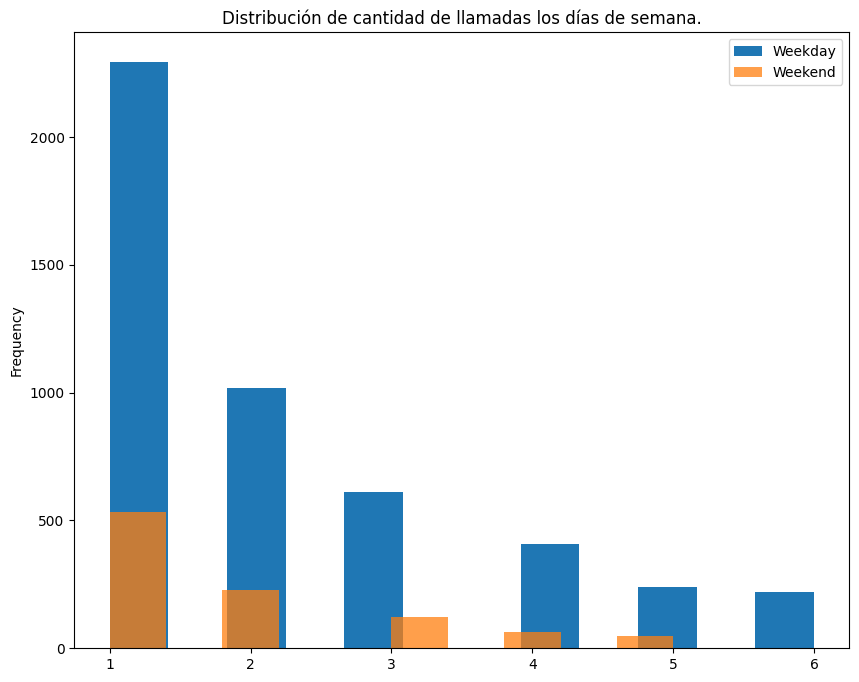

In [75]:
# Distribución de la cantidad de llamadas
calls_weekday['calls_count'].plot(
    kind='hist',
    bins=12,
    title="Distribución de cantidad de llamadas los días de semana.",
    xlabel='Cantidad de llamadas',
    ylabel='Frecuencia',
    figsize=(10, 8)
    

)
calls_weekend['calls_count'].plot(
    kind='hist',
    bins=10,
    alpha=0.75
)

plt.legend(['Weekday', 'Weekend'])
plt.show()

In [76]:
# Calcula la media, la varianza y la mediana de la cantidad de llamadas para la semana y el fin de semana

# Se calcula el promedio de las llamadas para weekday
print(f"-- Número de llamadas promedio para los días de semana: {calls_weekday['calls_count'].mean():.2f}")
print()

# Se calcula la mediana 
print(f"-- Mediana del número de llamadas para los días de semana: {calls_weekday['calls_count'].median():.2f}")
print()

# Se calcula la varianza
print(f"-- Varianza del número de llamadas para los días de semana: {np.var(calls_weekday['calls_count']):.2f}")
print()

# Se calcula el promedio de las llamadas para weekend
print(f"-- Número de llamadas promedio para el fin de semana:: {calls_weekend['calls_count'].mean():.2f}")
print()

# Se calcula la mediana 
print(f"-- Mediana del número de llamadas para el fin de semana: {calls_weekend['calls_count'].median():.2f}")
print()

# Se calcula la varianza
print(f"-- Varianza del número de llamadas para el fin de semana:: {np.var(calls_weekend['calls_count']):.2f}")
print()

-- Número de llamadas promedio para los días de semana: 2.15

-- Mediana del número de llamadas para los días de semana: 2.00

-- Varianza del número de llamadas para los días de semana: 2.11

-- Número de llamadas promedio para el fin de semana:: 1.86

-- Mediana del número de llamadas para el fin de semana: 1.00

-- Varianza del número de llamadas para el fin de semana:: 1.34



In [77]:
# Se crea un boxplot para observar la distribución del núemro de llamadas
print("-- Diagrama de cajas para el número de llamadas los días de semana:\n")
box_wd = px.box(x = calls_weekday['calls_count'], notched=True,
                title = 'Distribución del número de llamadas los días de semana', points = 'all',
                labels = {'x': 'Número de llamadas'})

box_wd.show()

print("-- Diagrama de cajas para el número de llamadas los fines de semana:\n")
box_wk = px.box(x = calls_weekend['calls_count'], notched=True,
                title = 'Distribución del número de llamadas los fines de semana', points = 'all',
                labels = {'x': 'Número de llamadas'})

box_wk.show()

-- Diagrama de cajas para el número de llamadas los días de semana:



-- Diagrama de cajas para el número de llamadas los fines de semana:



#### Prueba de la hipótesis

In [78]:
# Se realiza la prueba de hipótesis considerando que los dos datasets a comparar tienen varianzas diferentes

# Se establece el valor  alpha en 0.05
alpha = 0.05

result_mean_calls = st.ttest_ind(calls_weekday['calls_count'],
                                   calls_weekend['calls_count'],
                                   equal_var=False)

print('Valor p:', result_mean_calls.pvalue)
print()

# Se compara el valor 'p' obtenido con el nivel de significacion estadistica
if result_mean_calls.pvalue < alpha:
    print("Se rechaza la hipótesis nula.")
else:
    print("No se puede rechazar la hipótesis nula.")
print()

Valor p: 1.0085760703816695e-11

Se rechaza la hipótesis nula.



#### Conclusión

- El resultado de la prueba de hipótesis arroja que las muestras son diferentes, por lo tanto se rechaza la hipotesis nula.

- Esto quiere decir que los días de semana se tien un mayor número de llamadas perdidas.

- Este resultado nos permite considerar una operación más pequeña para los fines de semana, es decir, son necesarios menos operadores, pero también nos invita a revisar si es necesario contar con un mayor número de operadores los días de semana.

### Los operadores con llamadas salientes tiene mayor número de llamadas perdidas

- Hipotésis nula y alternativa:

     * $H_0$: El núemero de llamadas perdidas es igual para las llamadas entrantes y para las llamadas salientes.
     * $H_1$: El número de llamadas perdidas es diferente para las llamadas entrantes y para las llamadas salientes.

- Consideraciones:
    - La hpótesis nula se plantea porque partimos de la idea de que no hay diferencia entre los dos grupos que se van a estudiar. En este caso, el número de llamadas perdidas enter los operadores.
    - La hipótesis alternativa se plantea a partir de la hipótesis nula.
    - Se define el valor $\alpha = 0.05$

#### Obtener los datos

In [79]:
out_calls = calls_filter.query("(direction == 'out') & (is_missed_call == True)")
display(out_calls.head(3))

in_calls = calls_filter.query("(direction == 'in') & (is_missed_call == True)")
display(in_calls.head(3))

,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes,tariff_plan,date_start,first_week_day,operator_calls_duration,operator_duration_one_call,waiting_time_minutes
1,166377,2019-08-05 00:00:00+03:00,out,True,880022,True,3,0,5,5,8,Monday,0.0,0.083333,B,2019-08-01,2019-08-06 00:00:00+03:00,0.083333,0.027778,0.083333
2,166377,2019-08-05 00:00:00+03:00,out,True,880020,True,1,0,1,5,8,Monday,0.0,0.016667,B,2019-08-01,2019-08-06 00:00:00+03:00,0.016667,0.016667,0.016667
4,166377,2019-08-05 00:00:00+03:00,out,False,880022,True,3,0,25,5,8,Monday,0.0,0.416667,B,2019-08-01,2019-08-06 00:00:00+03:00,0.416667,0.138889,0.416667


,user_id,date,direction,internal,operator_id,is_missed_call,calls_count,call_duration,total_call_duration,day,month,day_of_week,call_duration_minutes,total_call_duration_minutes,tariff_plan,date_start,first_week_day,operator_calls_duration,operator_duration_one_call,waiting_time_minutes
0,166377,2019-08-04 00:00:00+03:00,in,False,0,True,2,0,4,4,8,Sunday,0.0,0.066667,B,2019-08-01,2019-07-30 00:00:00+03:00,0.0,0.0,0.066667
7,166377,2019-08-05 00:00:00+03:00,in,False,0,True,6,0,35,5,8,Monday,0.0,0.583333,B,2019-08-01,2019-08-06 00:00:00+03:00,0.0,0.0,0.583333
8,166377,2019-08-06 00:00:00+03:00,in,False,0,True,4,0,62,6,8,Tuesday,0.0,1.033333,B,2019-08-01,2019-08-06 00:00:00+03:00,0.0,0.0,1.033333


#### Filtrar datos atípicos

In [80]:
# Se encuentran y eliminan los valores atípicos de los dataset obtenidos en el paso anterior
# Se obtienen los rangos intercuartílicos para cada dataset
q1_in = in_calls['calls_count'].quantile(q=0.25)
q3_in = in_calls['calls_count'].quantile(q=0.75)
iqr_in = in_calls['calls_count'].apply(st.iqr)

q1_out = out_calls['calls_count'].quantile(q=0.25)
q3_out = out_calls['calls_count'].quantile(q=0.75)
iqr_out = out_calls['calls_count'].apply(st.iqr)

# Se filtra el dataset  'in_calls' para eliminar los valores atípicos
in_calls = in_calls[~((in_calls['calls_count'] < (q1_in-1.5*iqr_in)) |
                                          (in_calls['calls_count'] > (q3_in+1.5*iqr_in)))]


# Se filtra el dataset 'out_calls' para eliminar los valores atípicos
out_calls = out_calls[~((out_calls['calls_count'] < (q1_out-1.5*iqr_out)) |
                                          (out_calls['calls_count'] > (q3_out+1.5*iqr_out)))]

#### Descripción estadística de los datasets

1. Se observa la distribución del número de llamadas para cada tipo de llamada.
2. Se calcula la media, la mediana y la varianza del número de llamadas para cada tipo de llamada.
3. Se crea un box plot para cada tipo de llamada.

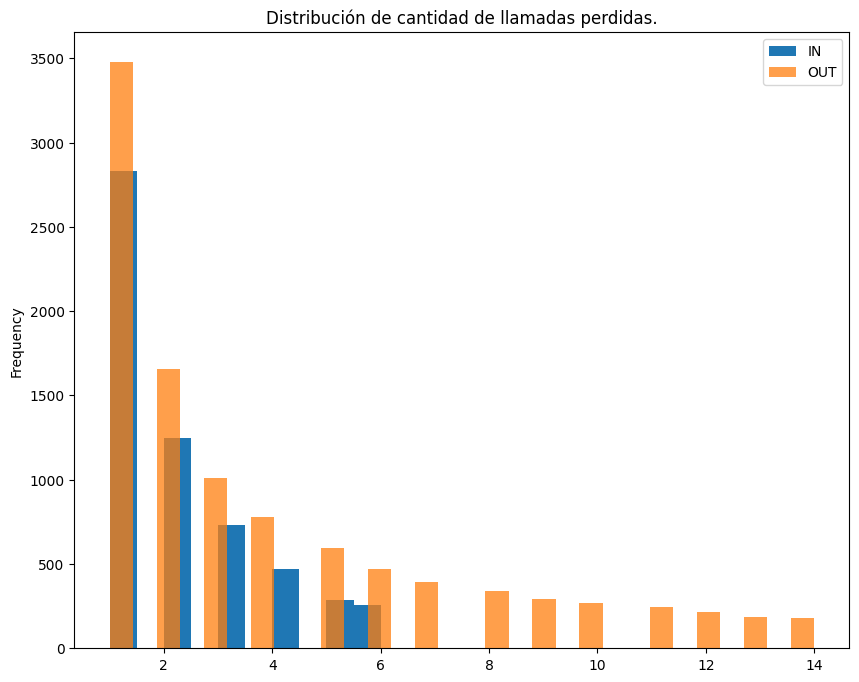

In [81]:
# Distribución de la cantidad de llamadas
in_calls['calls_count'].plot(
    kind='hist',
    bins=10,
    title="Distribución de cantidad de llamadas perdidas.",
    xlabel='Cantidad de llamadas',
    ylabel='Frecuencia',
    figsize=(10, 8)
    

)
out_calls['calls_count'].plot(
    kind='hist',
    bins=30,
    alpha=0.75
)

plt.legend(['IN', 'OUT'])
plt.show()

In [82]:
# Calcula la media, la varianza y la mediana de la cantidad de llamadas perdidas

# Se calcula el promedio de las llamadas perdidas para las llamadas entrantes
print(f"-- Número de llamadas perdidas promedio para las llamadas entrantes: {in_calls['calls_count'].mean():.2f}")
print()

# Se calcula la mediana 
print(f"-- Mediana del número de llamadas perdidas para las llamadas entrantes: {in_calls['calls_count'].median():.2f}")
print()

# Se calcula la varianza
print(f"-- Varianza del número de llamadas perdidas para las llamadas entrantes: {np.var(in_calls['calls_count']):.2f}")
print()

# Se calcula el promedio de las llamadas para las llamadas salientes
print(f"-- Número de llamadas promedio para las llamadas salientes: {out_calls['calls_count'].mean():.2f}")
print()

# Se calcula la mediana 
print(f"-- Mediana del número de llamadas perdidas para las llamadas salientes: {out_calls['calls_count'].median():.2f}")
print()

# Se calcula la varianza
print(f"-- Varianza del número de llamadas perdidas para las llamadas salientes: {np.var(out_calls['calls_count']):.2f}")
print()

-- Número de llamadas perdidas promedio para las llamadas entrantes: 2.13

-- Mediana del número de llamadas perdidas para las llamadas entrantes: 2.00

-- Varianza del número de llamadas perdidas para las llamadas entrantes: 2.07

-- Número de llamadas promedio para las llamadas salientes: 3.93

-- Mediana del número de llamadas perdidas para las llamadas salientes: 2.00

-- Varianza del número de llamadas perdidas para las llamadas salientes: 12.47



In [83]:
# Se crea un boxplot para observar la distribución del núemro de llamadas perdidas
print("-- Diagrama de cajas para el número de llamadas perdidas para las llamadas entrantes:\n")
box_in = px.box(x = in_calls['calls_count'], notched=True,
                title = 'Distribución del número de llamadas perdidas para las llamadas entrantes', points = 'all',
                labels = {'x': 'Número de llamadas'})
box_in.show()

print("-- Diagrama de cajas para el número de llamadas perdidas para las llamadas salientes:\n")
box_out = px.box(x = out_calls['calls_count'], notched=True,
                title = 'Distribución del número de llamadas los perdidas para las llamadas salientes', points = 'all',
                labels = {'x': 'Número de llamadas'})
box_out.show()

-- Diagrama de cajas para el número de llamadas perdidas para las llamadas entrantes:



-- Diagrama de cajas para el número de llamadas perdidas para las llamadas salientes:



#### Prueba de la hipótesis

In [84]:
# Se realiza la prueba de hipótesis considerando que los dos datasets a comparar tienen varianzas diferentes

# Se establece el valor  alpha en 0.05
alpha = 0.05

result_calls = st.ttest_ind(in_calls['calls_count'],
                                   out_calls['calls_count'],
                                   equal_var=False)

print('Valor p:', result_calls.pvalue)
print()

# Se compara el valor 'p' obtenido con el nivel de significacion estadistica
if result_calls.pvalue < alpha:
    print("Se rechaza la hipótesis nula.")
else:
    print("No se puede rechazar la hipótesis nula.")
print()

Valor p: 0.0

Se rechaza la hipótesis nula.



#### Conclusión

- Se encuentra que existe una significancia estadística entre la cantidad de llamadas perdidas entre las llamadas salientes y las llamadas entrantes.

- Se observa que para las llamadas salientes el número de llamadas perdidas es mayor, es posible que los usuarios no contesten las llamadas de los operadares.

- Este hallazgo sirve para diseñar estrategias que permitan a los operadores contactar a los usaurios de una forma efectiva, y también destinar mas operadores a otras actividades.

## Privacidad en el manejo de los datos.

En los datasets analizados no se encontró información sensible que permita identificar o individualizar a los usuarios o clientes, ni a los operadores o trabajadores.

Por lo anterior no fue necesario tomar medidas para resaguardar la privacidad de los clientes y empleados.

## Referencias consultadas

- [Plotly Open Source Graphing Library for Python](https://plotly.com/python/): esta fuente me permite personalizar y trazar gráficos.

- [Documentación oficial `dropna`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dropna.html): esta fuente me ayudó a resolver dudas sobre el uso del `dropna`.

- [Documentación oficial `pivoy_table`](https://pandas.pydata.org/docs/reference/api/pandas.pivot_table.html): para resovler dudas acerca de las tablas pivot en Pandas.

- [Documentación oficial `datetime`](https://pandas.pydata.org/docs/reference/api/pandas.to_datetime.html): par ersolver dudas acerca de como implementar la connversión de datos para los datos tipo fechas.

- [How to Bring Down Your Call-Abandon Rates ](https://www.callcentrehelper.com/how-to-bring-down-your-call-abandon-rates-50805.htm): esta fuetne me ayudó a determinar el tiempo de abandono óptimo para una llamada.

- [Call Center Key Performance Indicators](https://whatagraph.com/blog/articles/call-center-kpi): esta fuente me ayudó a entender cómo se determinan y se crean los KPI's en un Call Center.

- [Privacidad de datos, seguridad de datos y protección de datos](https://www.computerweekly.com/es/definicion/Privacidad-de-datos-seguridad-de-datos-y-proteccion-de-datos): artículo sobre la privacidad y seguridad de los datos, esto para entender cómo los datos analizados podrían afecta a los usuarios.

## Presentación

Esperaré hasta la primera iteración para avanzar con la presentación, esto en caso de que tenga que realizar alguna corrección en los análisis.

## Dashboard

En proceso de realización.